## PW on graphcut optimization (binary case)
This session is divided into 3 parts:


* a part on Bayesian classification (see PW1 and PW2)
* a part on object/background segmentation of a colour image with a CRF (conditional random filed)
* a part on the iterative segmentation of a textured image

We will use the PyMaxflow library for the calculation of the graphcut.

In [1]:
import math
import random
import numpy as np
import matplotlib.pyplot as plt

import platform
import tempfile
import os
from scipy import ndimage as ndi
try:
    import maxflow # if not installed, install Maxflow
except:
    !pip install PyMaxflow # For Google Collab
    import maxflow

from skimage import io
from bokeh.plotting import figure, output_file, show
from bokeh.plotting import show as showbokeh
from bokeh.io import output_notebook
output_notebook()

def display_segmentation_borders(image, bin):
    imagergb = np.copy(image)
    from skimage.morphology import binary_dilation, disk
    contour = binary_dilation(bin,disk(15))^bin
    imagergb[contour==1,0] = 255
    imagergb[contour==1,1] = 0
    imagergb[contour==1,2] = 0
    return imagergb

Loading BokehJS ...

## Binary classification of a noisy image

You have a binary image *IoriginaleBW.png* (binary image of the two classes) and its observed version with a certain distribution of grey levels for each class *Iobservee.png*. The objective is to perform a two-class classification of this observed image (see PW1 and PW2).

### Analysis of the distributions of the 2 classes of the image}


Q1: What are the distributions of the two classes of the image ($P(Y_s|X_s=0)$ (black class) and $P(Y_s|X_s=1)$ (white class))?

Q2: Give the means and variances of the two classes (CF. code of Q8).

*The distributions and the means and variances found in the previous sessions will be used without justification*.

**Your answer &#x270D;**

A1: Les deux classes suivent une distribution gaussienne.

A2: On a:
-classe 0: de moyenne 97 et de variance 516

-classe 1: de moyenne 163 et de variance 512

## 1.1: Graphcut optimization

Q3: How many nodes does the graph have that is constructed for the search for the minimum capacity cut with only two neighbouring pixels? What do they correspond to? What do the data attachment terms in this graph correspond to and what values do they have for two observed pixels of values $y_s$ and $y_t$? What does the regularisation term correspond to?

**Your answer &#x270D;**

A3: 

- Avec seulement deux pixels voisins, le graphe contient 4 noeuds qui correspondent à : 
    - un noeud pour la source ( label 0) et un pour le puit (label 1)
    - un noeud pour le pixel s et un noeud pour le pixel t

- Les termes d'attachement aux données correspondent à: ( comme il s'agit d'une distribution gaussienne)
$$
D(x_s, y_s) = -\ln\left(P(Y_s \mid X_s)\right) = -\ln\left(\exp\left(-\frac{(y_s - x_s)^2}{2 \sigma^2}\right)\right) = \frac{(y_s - x_s)^2}{2 \sigma^2}
$$

donc on peut exprimer chacun des termes:

$$

D(0, y_s) = \frac{(\mu_0 - y_s)^2}{2 \sigma^2};D(1, y_s) = \frac{(\mu_1 - y_s)^2}{2 \sigma^2};D(0, y_t) = \frac{(\mu_0 - y_t)^2}{2 \sigma^2};D(1, y_t) = \frac{(\mu_1 - y_t)^2}{2 \sigma^2};

$$

- Le terme de régularisation correspond à $\beta$

$$

Q4: Complete the python code cell where it says "#TO BE COMPLETED EX1" with the data attachment and regularization terms as indicated. Run the minimum cut algorithm and view the result.

## 1.2 Searching for the optimal $\beta$.



Q5: By completing the program frame provided below, find the optimal $\beta$ value $\beta_{opt}$ using the "true image" $x$ corresponding to IoriginaleBW.png. You can plot the error values between $x$ and the estimated $\hat{x}$ to find $\beta_{opt}$.



**Your answer &#x270D;**

A5: On obtient $\beta_{opt}$ = 1720

Q6: What are the advantages of this optimization approach compared to ICM? Compared to simulated annealing? In theory, do we obtain the same result with both methods (simulated annealing and graphcut)? Under what conditions? What is the advantage of simulated annealing in the general case?

**Your answer &#x270D;**

A6: 
- Les avantages de cette méthode d'optimisation comparée à l'ICM sont: le fait qu'on obtient un minimum global et non local, sa rapidité, et le fait que le résultat ne dépend pas d'une initialisation.

- Comparé au simulated annealing, l'avantage est sa rapidité.

- En théorie, on obtient les mêmes résultats avec les deux méthodes si l'énergie est de forme sous-modulaire et si on a la bonne initialisation de la température et du pas pour le simulated annealing.

- Dans le cas général, l'avantage du simulated annealing est que cette méthode marche pour toute forme d'énergie.


Q7: If we get different results between ICM and graph-cut, or between simulated annealing and graph-cut (if the conditions for the simulated annealing to give the global minima are not respected), how can you explain that the error rate with the true image can be lower with the ICM result of the simulated annealing one than with the graph-cut optimization?
  

**Your answer &#x270D;**

A7: Les algorithmes de recuit simulé et ICM explorent différentes configurations aléatoires et peuvent tomber "accidentellement" sur une meilleure solution que le graph cut qui est déterministe et trouve une solution fixée.

De plus, si on prend une très bonne initialisation l'ICM pourrait peut-être donner un meilleur résultat que le graph cut.

Q8: What are the advantages and disadvantages of the Ising model?

**Your answer &#x270D;**

A8: Le modèle d'Ising est simple et permet des implémentations rapides. Il favorise les formes compactes. Ainsi il n'est pas adapté pour les contours/ formes fines.

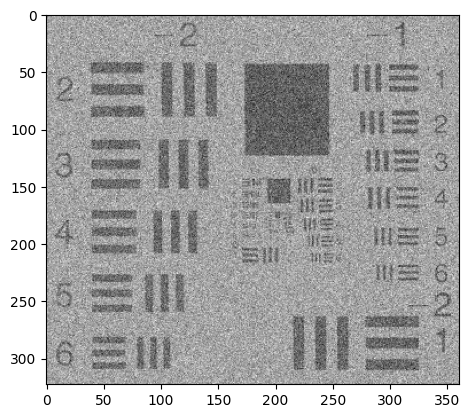

In [3]:
# Loading images
im_obs=io.imread("https://perso.telecom-paristech.fr/tupin/cours/IMA203/TPMARKOV/Iobservee.png") # Observed image, noisy
im_orig=io.imread("https://perso.telecom-paristech.fr/tupin/cours/IMA203/TPMARKOV/IoriginaleBW.png") # Binary reference image, to assess the quality of the segmentation

plt.imshow(im_obs,cmap='gray')

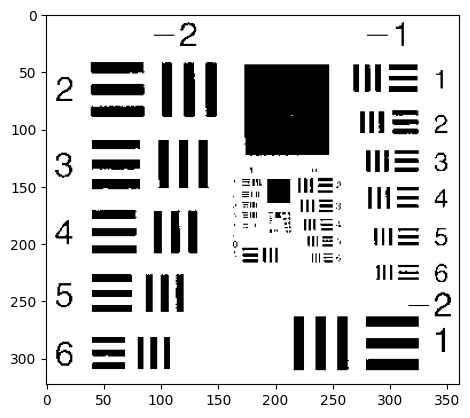

In [4]:
plt.imshow(im_orig, cmap='gray')

In [7]:
#### to be completed
# TO BE COMPLETED EX1
# /!\ beta, m0 and m1 must be floats to avoid some issues. For example: "beta = 1.".
beta = 1000. # beta value
m0 = 97. # m0 and m1 values from the previous practical work
m1 = 163.

## binary graph-cut

# Create the graph.
g = maxflow.Graph[float]() # Graph instantiation

# Add the nodes.
# nodeids has the identifiers of the nodes in the grid.
# It creates a set of nodes for all the pixels of the image
nodeids = g.add_grid_nodes(im_obs.shape)

# Add non-terminal edges with the same capacity.
# the edge has the value beta for all adjacent pixels in 4-connexity
g.add_grid_edges(nodeids, beta)

# Add the terminal edges.
# the second argument correspond to the set of edge values to the source
# the third argument correspond to the set of edge values to the sink
map_Us_0 = (im_obs-m0)**2
map_Us_1 = (im_obs-m1)**2
g.add_grid_tedges(nodeids, map_Us_0,map_Us_1)

# Find the maximum flow.
flow = g.maxflow()

print("Max Flow:", str(flow))
# Get the labels of the nodes in the grid.
# output is 0 if the node is connected to the source, else output is 1
sgm = g.get_grid_segments(nodeids)
im_bin = np.int_(np.logical_not(sgm))


Max Flow: 69059886.0


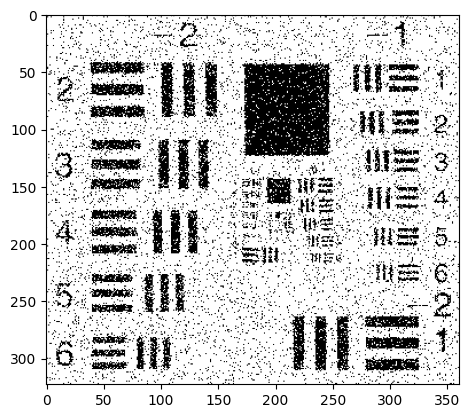

In [6]:
plt.imshow(im_bin,cmap='gray')

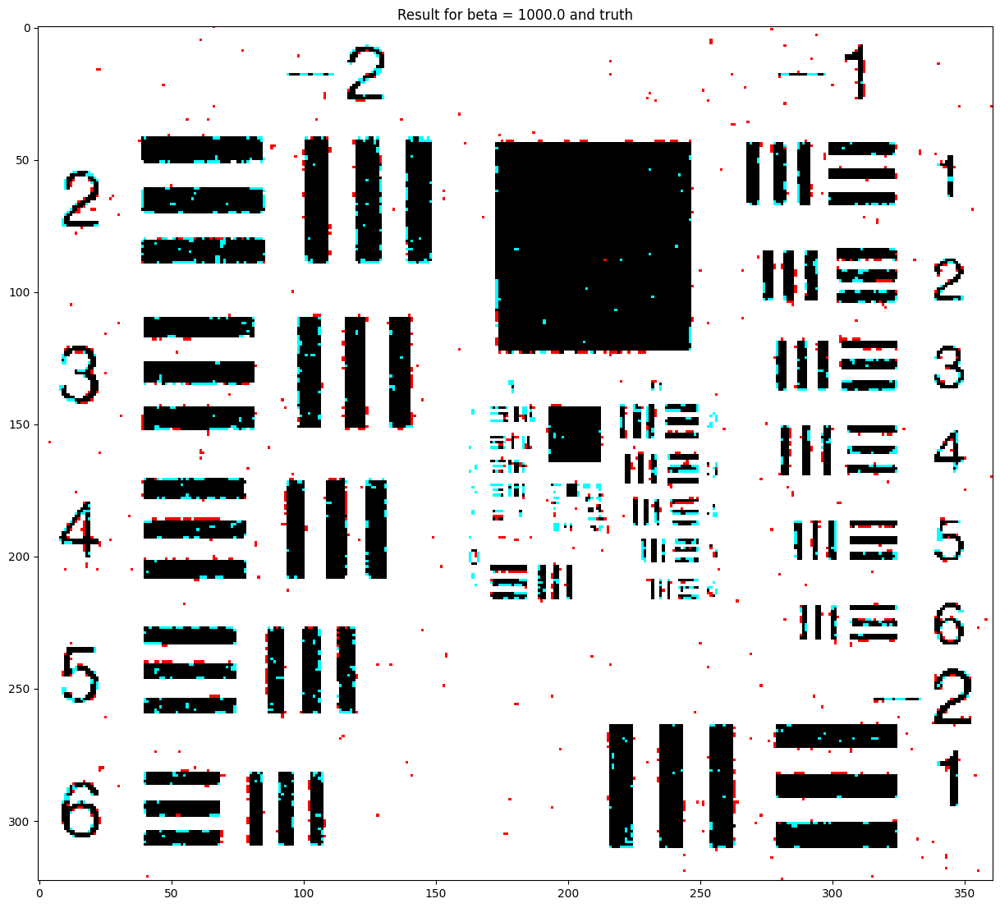

Number of misclassified pixels for beta =  1000.0 :  2743


In [8]:
# compute the error image between im_bin and im_orig (the ideal solution) using np.abs and np.sum
error = np.sum(np.abs(im_bin - im_orig))
plt.rcParams['figure.figsize'] = [15, 15]
# visualize the differences between the original image and the solution
plt.figure()
plt.imshow(np.dstack((np.int_(im_orig), im_bin, im_bin))*255)
plt.title("Result for beta = " + str(beta) + " and truth")
plt.show()

print("Number of misclassified pixels for beta = ",beta,": ",int(error))

### Search for the best parameter $\beta$

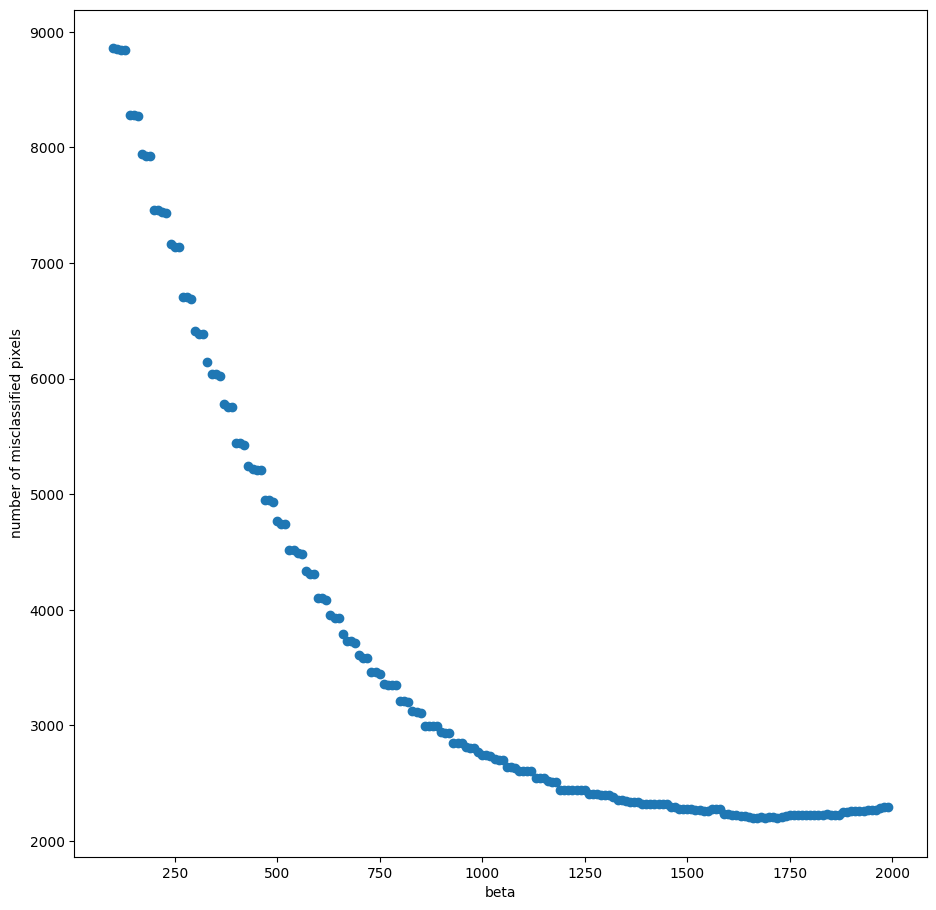

Best beta value:  1720


In [67]:
im_obs=io.imread("https://perso.telecom-paristech.fr/tupin/cours/IMA203/TPMARKOV/Iobservee.png") # Observed image, noisy
im_orig=io.imread("https://perso.telecom-paristech.fr/tupin/cours/IMA203/TPMARKOV/IoriginaleBW.png") # Binary reference image, to assess the quality of the segmentation

list_beta = []
list_errors = []

# TO BE COMPLETED - choose a range of values and a step to study beta
for beta in range(100, 2000,10) :
    # TO BE COMPLETED
    m0 = 97.
    m1 = 163.

    ## Binary graph cut

    # Create the graph
    g = maxflow.Graph[float]() # graph instantiation

    # Add the nodes. nodeids has the identifiers of the nodes in the grid.
    nodeids = g.add_grid_nodes(im_obs.shape)
    # Add non-terminal edges with the same capacity.
    g.add_grid_edges(nodeids,beta)
    # Add the terminal edges.
    #TO BE COMPLETED
    map_Us_0 = (im_obs-m0)**2
    map_Us_1 = (im_obs-m1)**2
    g.add_grid_tedges(nodeids, map_Us_0, map_Us_1)

    # Find the maximum flow.
    flow = g.maxflow()

    # Get the segments of the nodes in the grid.
    sgm = g.get_grid_segments(nodeids)
    # create the output image
    im_bin = np.int_(np.logical_not(sgm))

    # print("beta = ",beta)
    # compute the error
    #TO BE COMPLETED
    error = np.sum(np.abs(im_bin - im_orig))
    list_beta.append(beta)
    list_errors.append(error)

plt.figure()
plt.scatter(list_beta,list_errors)
plt.xlabel("beta")
plt.ylabel("number of misclassified pixels")
plt.show()

best_beta = list_beta[np.argmin(np.array(list_errors))]

print('Best beta value: ', best_beta)

## 2. Classification of a colour image

The objective of this part is to carry out an extension of the method seen previously in the case of the treatment of a colour image *avions.png* in which one wants to separate the objects from the background.

We will first use the same framework (Ising model) as before but with a three-dimensional data attachment (assuming convariance matrices equal to the identity). Then we will introduce a CRF (conditional random field) by weighting the regularisation term of the Ising model by the modulus of the gradient between two pixels of the observed image.  

### 2.1 Binary classification with Ising model
From the program structure below, carry out the different steps necessary for this classification:
1. Modelling of the background and object distributions (in 3 dimensions this time)
1. Definition of the data attachment term
1. Choice of a value for the regularisation parameter for the Ising model
1. Finding the minimal cut to obtain the object/background classification.

Q9: Comment on these steps and the results obtained.

**Your answer &#x270D;**

A9:
- On peut afficher les couleurs moyennes correspondant au modèle pour le fond et les avions et s'assurer que les deux couleurs obtenues sont cohérentes avec la couleur des avions et celle du fond.

- terme d'attache au données:  distance à la source.

- Pour le choix du paramètre de régularisation, $\beta$= 11500 donne un bon résultat (en dessous, on a encore des tâches/ du bruit sur le fond)

Le résultat obtenu est satisfaisant: on arrive à extraire les avions. Il y a des défauts au niveau des contours.

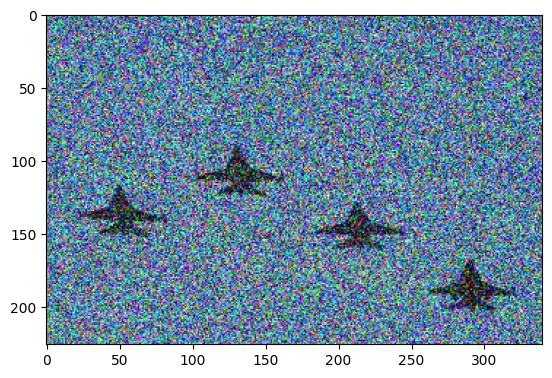

In [2]:
# Loading and displaying the image
#im_planes=io.imread('https://www.dropbox.com/s/ylm0ut8ipu5oonb/avions.png?dl=1')
im_planes=io.imread("https://perso.telecom-paristech.fr/tupin/cours/IMA203/TPMARKOV/planes.png")

plt.figure()
#plt.imshow(im_obs,vmin=0,vmax=255)
plt.rcParams['figure.figsize'] = [15, 15]
plt.imshow(im_planes)
plt.show()


#### Determining the parameters of the classes


Plane class: we can use the values of the rectangle [180:200,280:300].

example 1: np.mean(image[180:200,280:300,1]) returns the average of the selected area for channel 1.

example 2: np.mean(image[180:200,280:300,:], axis=(0, 1)) returns the average over the two first axis (height and width) of the selected area, which is here a np.array of size (3,).

For the sky, [R,G,B] =  [ 93.96126667 127.14426667 156.2286    ]
For the planes, [R,G,B] =  [53.645  56.4725 70.2075]


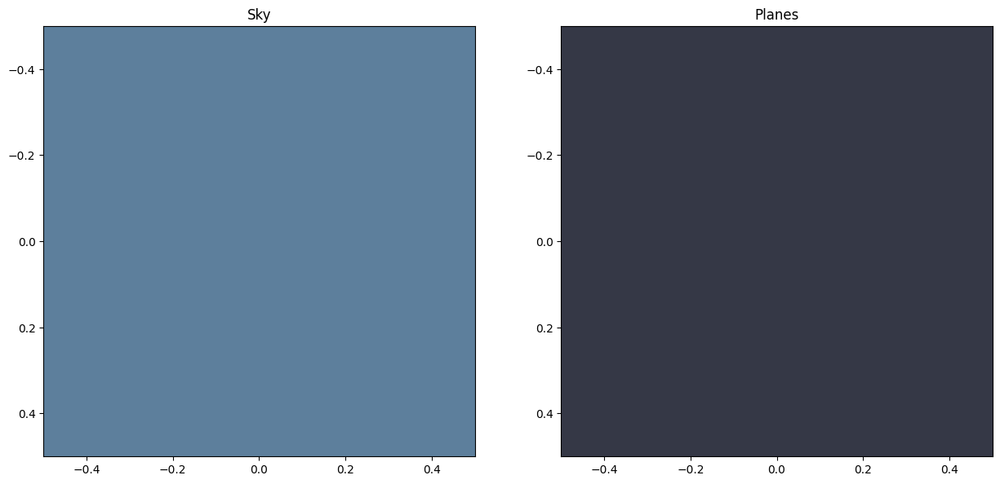

In [5]:
# mean of the plane class - 3D vector
# you can use values in the following square [180:200,280:300]
# TO BE COMPLETED
m_planes = np.mean(im_planes[180:200,280:300], axis=(0,1))

# mean of the sky class
# you can use values in the following square [0:100,150:300]
# TO BE COMPLETED
m_sky = np.mean(im_planes[0:100,150:300], axis=(0,1))

print('For the sky, [R,G,B] = ', m_sky)
print("For the planes, [R,G,B] = ", m_planes)

# check that the obtained values are coherent

# affichons les couleurs moyennes obtenues  pour vérifier la cohérence
plt.figure()
plt.subplot(1,2,1)
plt.imshow(np.array([[m_sky]]).astype(np.uint8))
plt.title('Sky')
plt.subplot(1,2,2)
plt.imshow(np.array([[m_planes]]).astype(np.uint8))
plt.title('Planes')
plt.show()

In [26]:
# Choose a beta value
# TO BE COMPLETED
beta = 11500.

# TO BE COMPLETED
## Binary graph-cut
# use the previous program to create the graph and compute the cut
# be careful of computing the terminal weights using the 3D values
# you can compute 2 distance images with in each pixel the quadratic
# distance to the mean value of each class

m0 = m_planes 
m1 = m_sky

## binary graph-cut

# Create the graph.
g = maxflow.Graph[float]() # Graph instantiation

# Add the nodes.
# nodeids has the identifiers of the nodes in the grid.
# It creates a set of nodes for all the pixels of the image
nodeids = g.add_grid_nodes(im_planes.shape[:2])

# Add non-terminal edges with the same capacity.
# the edge has the value beta for all adjacent pixels in 4-connexity
g.add_grid_edges(nodeids, beta)

# Add the terminal edges.
# the second argument correspond to the set of edge values to the source
# the third argument correspond to the set of edge values to the sink
map_Us_0 = np.sum((im_planes-m0)**2, axis=2)
map_Us_1 = np.sum((im_planes-m1)**2, axis=2)
g.add_grid_tedges(nodeids, map_Us_0,map_Us_1)

# Find the maximum flow.
flow = g.maxflow()

print("Max Flow:", str(flow))
# Get the labels of the nodes in the grid.
# output is 0 if the node is connected to the source, else output is 1
sgm = g.get_grid_segments(nodeids)
im_bin = np.int_(np.logical_not(sgm))










Max Flow: 1088923395.2266574


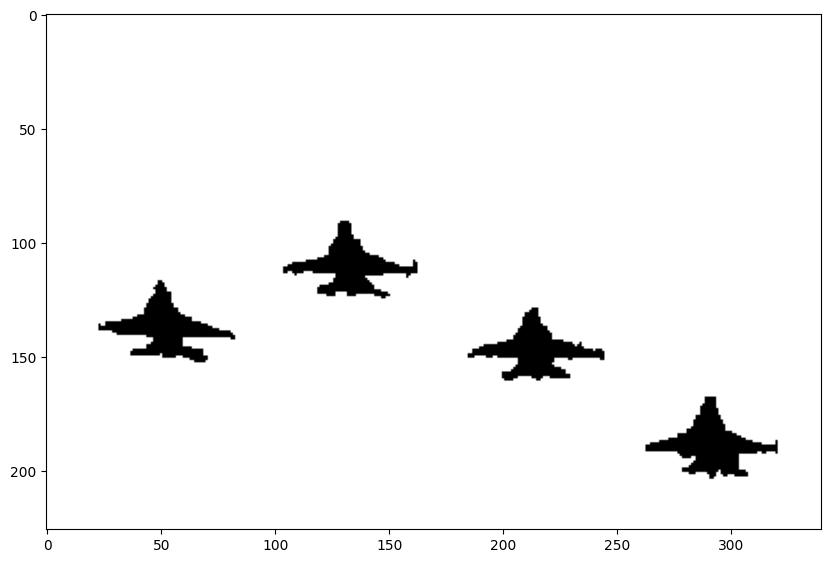

In [27]:
plt.rcParams['figure.figsize'] = [10, 10]
plt.imshow(im_bin, cmap='gray')

### 2.2 Use of a CRF (Conditional Random Field) model

We will try here to adapt the model used previously to favour transitions where they are compatible with the gradient. To do this, we will replace the constant $\beta$ for the whole image by a "beta_field" which depends on the norm of the gradient.

Q10: Calculate and display the modulus of the gradient of the aircraft image after it has been grayscaled and convolved by a Gaussian kernel of standard deviation 1. Why use the "boundary='symm'" option when convolving through the Sobel filter? Try it without doing the Gaussian filtering. What is the point?

**Your answer &#x270D;**

A10:
- On utilise l'option "boundary='symm'" pour la convolution avec le filtre de sobel car elle permet d'éviter les artefacts aux bords de l'image, les faux contours. ( en remplissant les bords de l'image en "miroir" symétrique des pixels situés à la frontière pour pouvoir calculer le gradient).

- En essayant sans le filtrage Gaussien, le résultat obtenu n'est pas satisfaisant: on ne discerne pas le contour des avions. Le but du filtrage Gaussien est donc de garder l'information des contours des avions. 

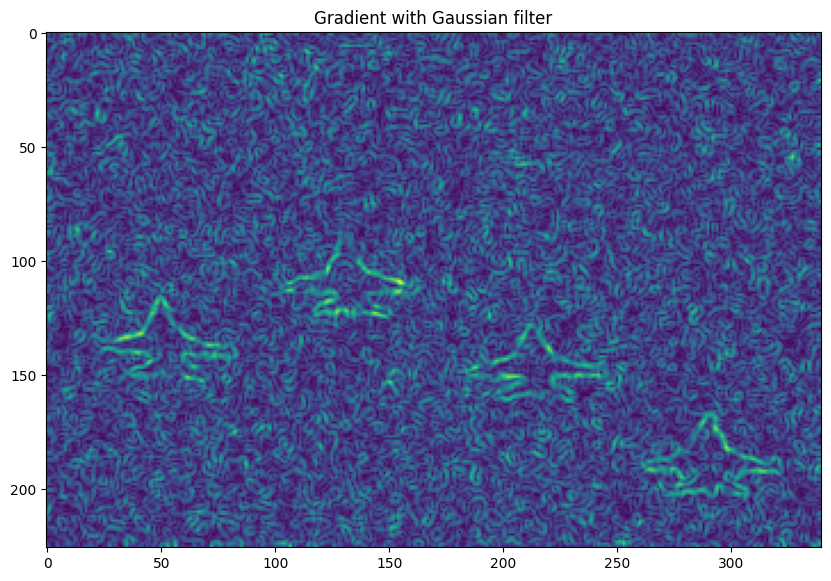

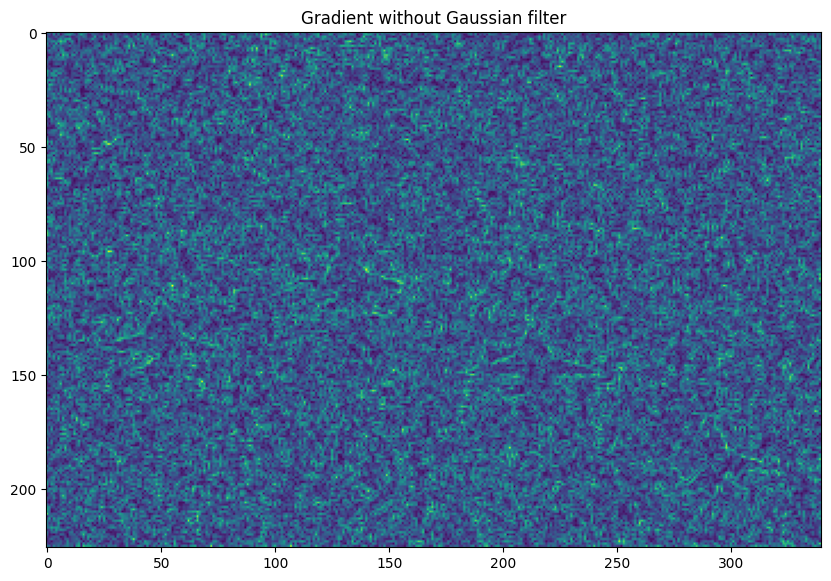

In [38]:
import scipy.signal
import scipy.ndimage
from skimage import color

def gradient(image):
    """ Array -> tuple[Array*Array]"""
    sobel_x = np.array([[-1, 0, 1], [-2, 0, 2], [-1, 0, 1]], dtype = float)
    sobel_y = np.array([[-1, -2, -1], [0, 0, 0], [1, 2, 1]], dtype = float)
    # to be completed
    # use mode = 'same' and boundary='symm' in scipy.signal.convolve2d
    # TO BE COMPLETED
    derivative_x = scipy.signal.convolve2d(image, sobel_x, mode='same', boundary='symm')
    derivative_y = scipy.signal.convolve2d(image, sobel_y, mode='same', boundary='symm')
    return([derivative_x,derivative_y])

plane_nb = scipy.ndimage.gaussian_filter(color.rgb2gray(im_planes), 1)
plane_x, plane_y = gradient(plane_nb)
# calculation of the gradient modulus
# TO BE COMPLETED
grad_av = np.sqrt(plane_x**2 + plane_y**2)
plt.figure()
plt.imshow(grad_av, label='gradient')
plt.title('Gradient with Gaussian filter')
plt.show()

## version sans appliquer le filtre gaussien
plane_nb = color.rgb2gray(im_planes)
plane_x, plane_y = gradient(plane_nb)
grad_av_sans_filtre = np.sqrt(plane_x**2 + plane_y**2)
plt.figure()
plt.imshow(grad_av_sans_filtre, label='gradient')
plt.title('Gradient without Gaussian filter')
plt.show()


Complete the code for segmentation by CRF. We will choose $beta\_field=\beta_2\cdot\exp(-grad\_av/h)$. We can use $h=3$ and $\beta_2=20000$. Also replace the constant beta by the field "beta_field" during the "g.add_grid_edges" step.

Q11: Compare the results with and without the contour term.

**Your answer &#x270D;**

A11: Avec le terme de contours, le résultat est aussi satisfaisant, avec légèrement moins de défauts au niveau des contours des avions. On peut noter cependant que on utilise un beta2 de 20000, nettement plus élevé que le beta minimum nécessaire à la méthode sans terme de contours.

Max Flow: 1092810990.4469407


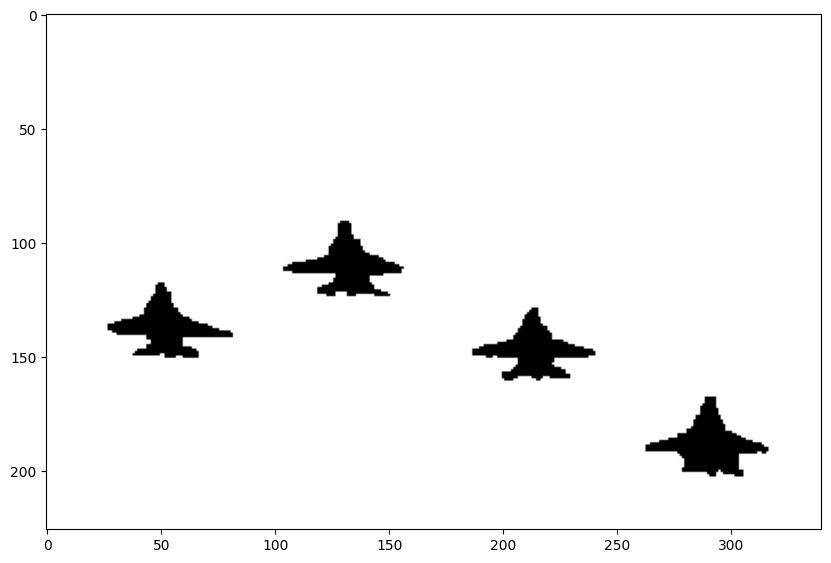

In [36]:
# Calculation of beta_field.
# This field will define the value for 4-neighborhood
# TO BE COMPLETED
h =3
beta2 =20000
beta_field = beta2 * np.exp(-grad_av/h)

# TO BE COMPLETED
## Binary graph-cut
# Complete by replacing beta with beta_field in your previous
# program on the line g.add_grid_edges

## binary graph-cut

# Create the graph.
g = maxflow.Graph[float]() # Graph instantiation

# Add the nodes.
# nodeids has the identifiers of the nodes in the grid.
# It creates a set of nodes for all the pixels of the image
nodeids = g.add_grid_nodes(im_planes.shape[:2])

# Add non-terminal edges with the same capacity.
# the edge has the value beta for all adjacent pixels in 4-connexity
g.add_grid_edges(nodeids, beta_field)

# Add the terminal edges.
# the second argument correspond to the set of edge values to the source
# the third argument correspond to the set of edge values to the sink
map_Us_0 = np.sum((im_planes-m0)**2, axis=2)
map_Us_1 = np.sum((im_planes-m1)**2, axis=2)
g.add_grid_tedges(nodeids, map_Us_0,map_Us_1)

# Find the maximum flow.
flow = g.maxflow()

print("Max Flow:", str(flow))
# Get the labels of the nodes in the grid.
# output is 0 if the node is connected to the source, else output is 1
sgm = g.get_grid_segments(nodeids)
im_bin = np.int_(np.logical_not(sgm))

plt.rcParams['figure.figsize'] = [10, 10]
plt.imshow(im_bin, cmap='gray')






## 3. Iterative Segmentation with Gaussian Mixture

Q12: Display the "zebra" image below. Is it possible to segment the zebra with the method used to segment the planes?



**Your answer &#x270D;**

A12: Je dirais que non car l'objet à isoler ( le zèbre) n'a pas une couleur uniforme mais des rayures de deux couleurs: il y a deux classes à considérer pour le zèbre et une pour le fond ( dans le cas des avions, les avions constituaient une seule classe). On ne peut pas binariser la situation directement entre le fond et l'objet (zèbre).

uint8


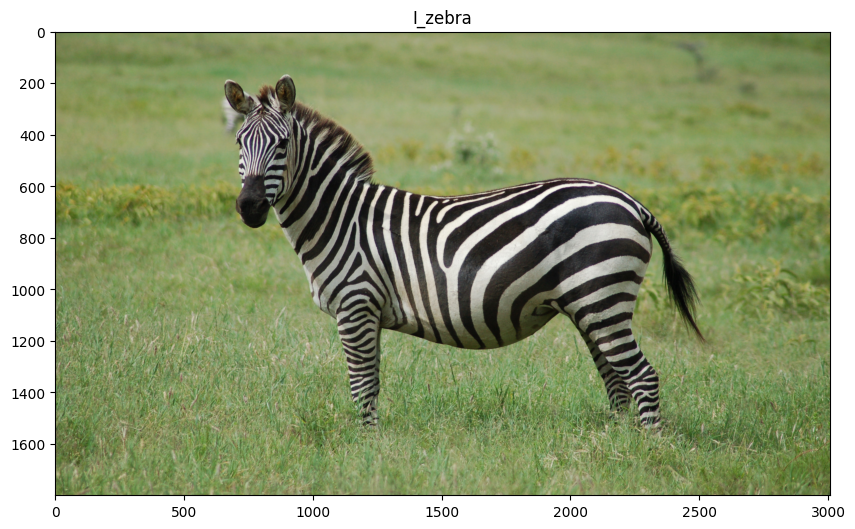

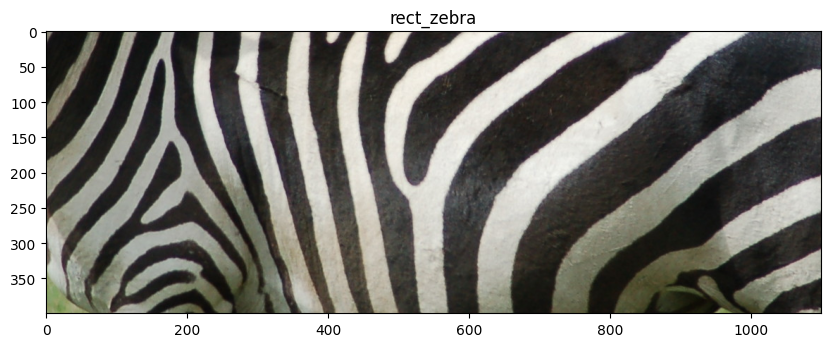

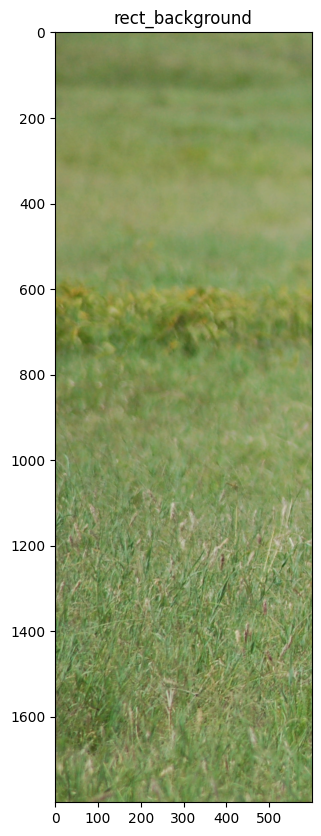

In [39]:
### Loading a new image
I_zebra = io.imread("https://perso.telecom-paristech.fr/tupin/cours/IMA203/TPMARKOV/Equus_quagga.jpg")
I_zebra = I_zebra[200:,:,:]
rect_zebra = I_zebra[700:1100,1000:2100]
rect_background = I_zebra[:,0:600]
print(I_zebra.dtype)

plt.figure()
plt.imshow(I_zebra)
plt.title('I_zebra')
plt.show()

plt.figure()
plt.imshow(rect_zebra)
plt.title('rect_zebra')
plt.show()

plt.figure()
plt.imshow(rect_background)
plt.title('rect_background')
plt.show()

Q13: Calculate the covariance matrix for the rect_zebra and the rect_background. Display the values and comment on the result. What do the diagonal values correspond to?

**Your answer &#x270D;**

A13: 
- On peut noter que les coefficients de la matrice de covariance sont nettement plus élevés pour rect_zebra que pour rect_background ce qui est logique car on a une plus grande variation pour le motif du zèbre ( alternance noir / blanc) que pour le fond d'herbe ( fond globalement vert).

- Les valeurs diagonales correspondent à la variance.

In [40]:
print(I_zebra.shape)
V_tulip = np.vstack([I_zebra[:,:,i].flatten() for i in range(3)])
print(I_zebra.shape)

M_cov = np.cov(np.vstack([I_zebra[:,:,i].flatten() for i in range(3)]))
print('Full zebra image')
print(M_cov)

M_cov = np.cov(np.vstack([rect_zebra[:,:,i].flatten() for i in range(3)]))
print('Rectangle zebra')
print(M_cov)

M_cov = np.cov(np.vstack([rect_background[:,:,i].flatten() for i in range(3)]))
print('Rectangle background')
print(M_cov)

(1800, 3008, 3)
(1800, 3008, 3)
Full zebra image
[[1505.54438095 1533.04278068 1229.71568017]
 [1533.04278068 1691.10755214 1221.09280991]
 [1229.71568017 1221.09280991 1210.38328951]]
Rectangle zebra
[[5504.73383563 5535.4436469  5290.02896111]
 [5535.4436469  5588.18500866 5329.06646681]
 [5290.02896111 5329.06646681 5143.99751626]]
Rectangle background
[[313.37936128 226.13253307 255.56699124]
 [226.13253307 219.38193629 221.71082516]
 [255.56699124 221.71082516 308.63086939]]


Q14: Display the histogram for the R, G and B channels for the "rect_zebra" image. Comment on the result.

**Your answer &#x270D;**

A14:
- Pour l'image rect_zebra, les histogrammes des canaux R,G et B sont très similaires et présentent deux pics: un vers 50 et un vers 200. Cela montre bien que l'image présente 2 classes ( qui correspondent au noir et au blanc).

- Pour l'image rect_background, les histogrammes ne présentent qu'un seul pic, ce qui montre que le fond ne présente qu'une seule classe.

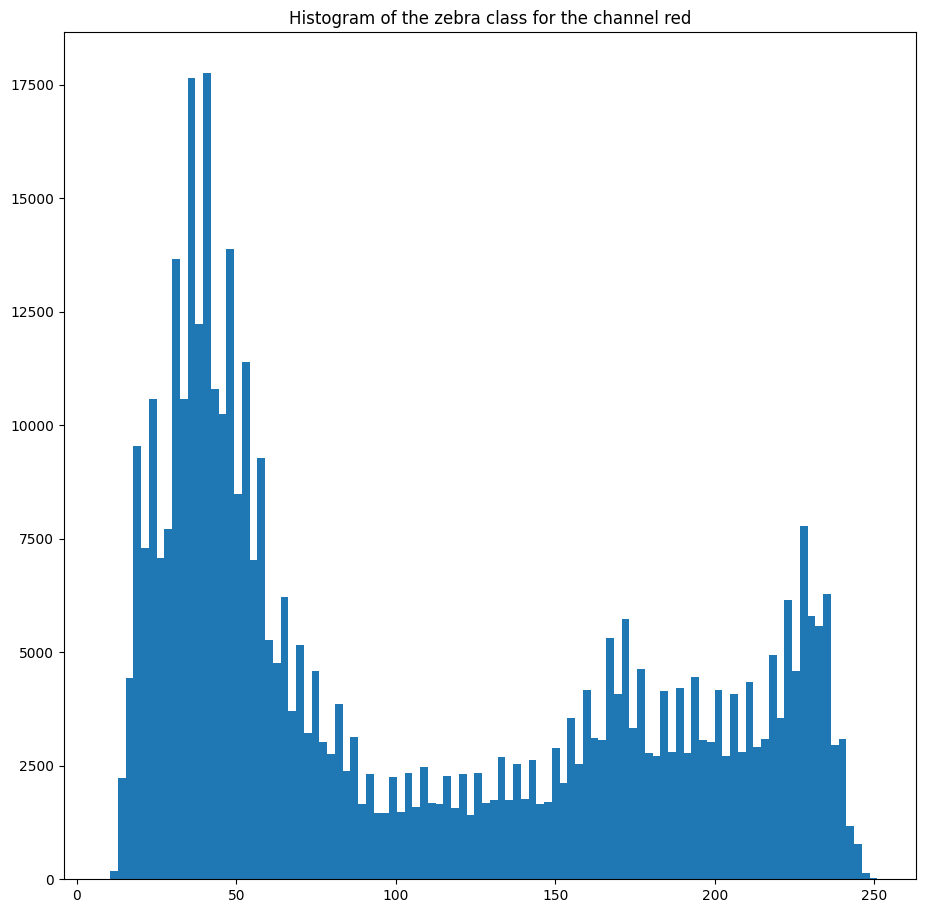

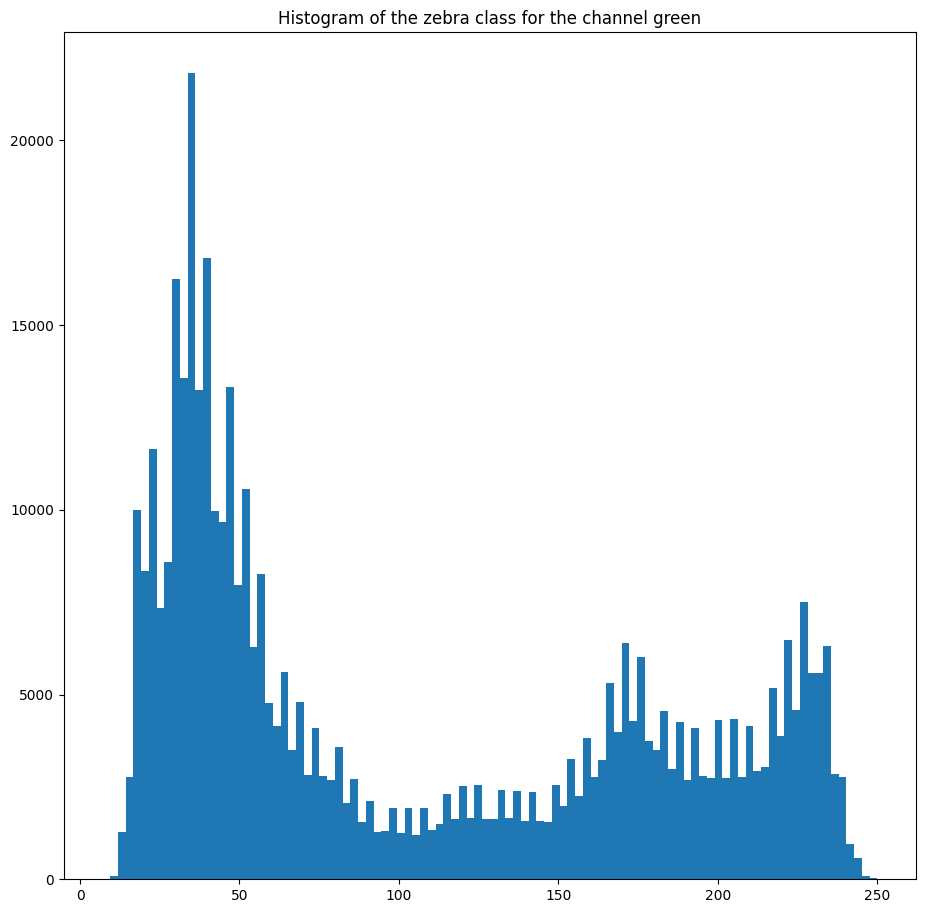

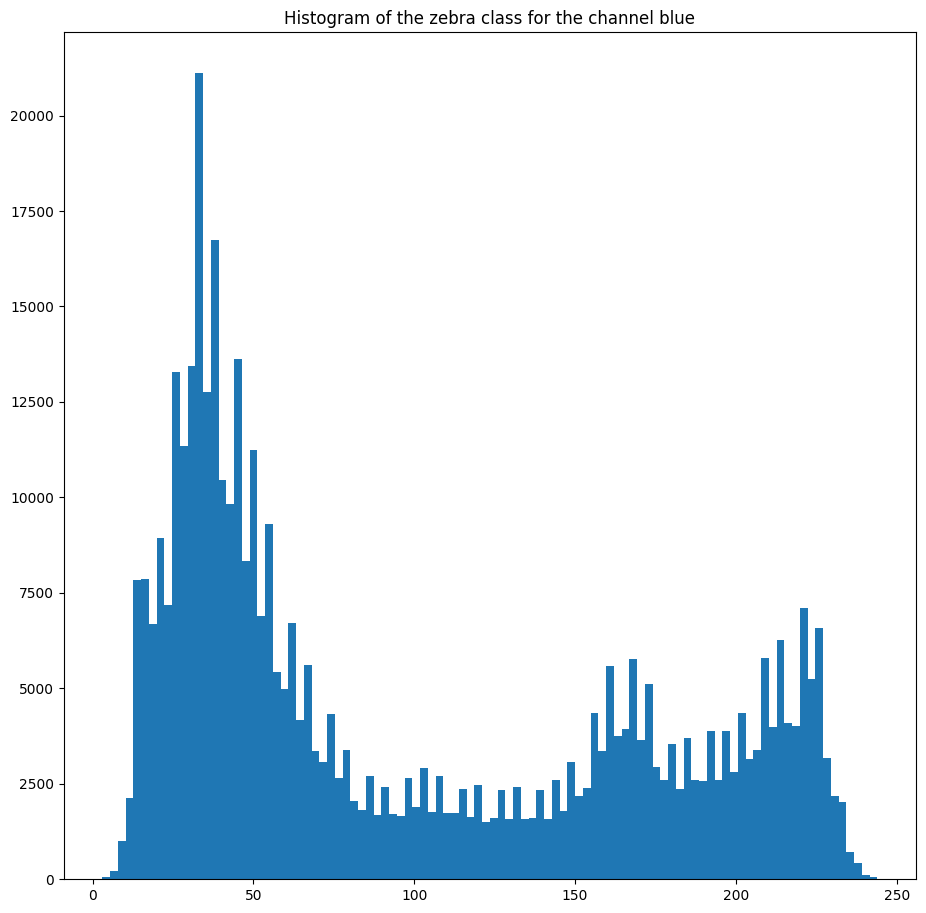

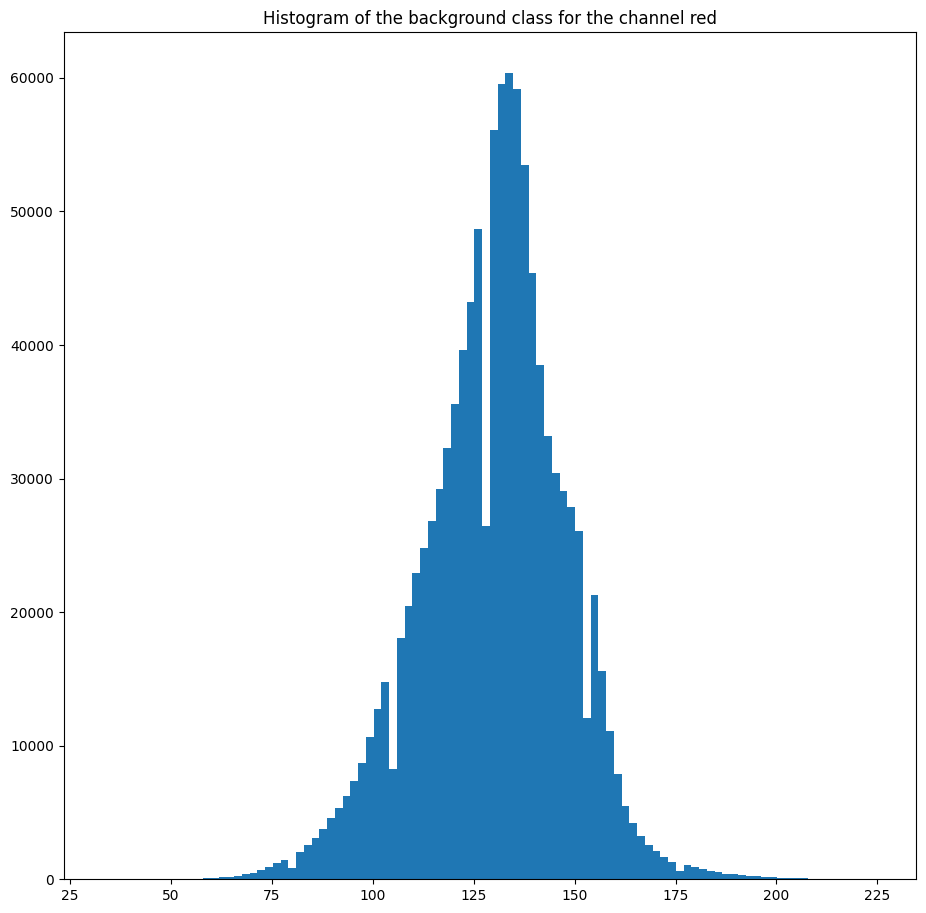

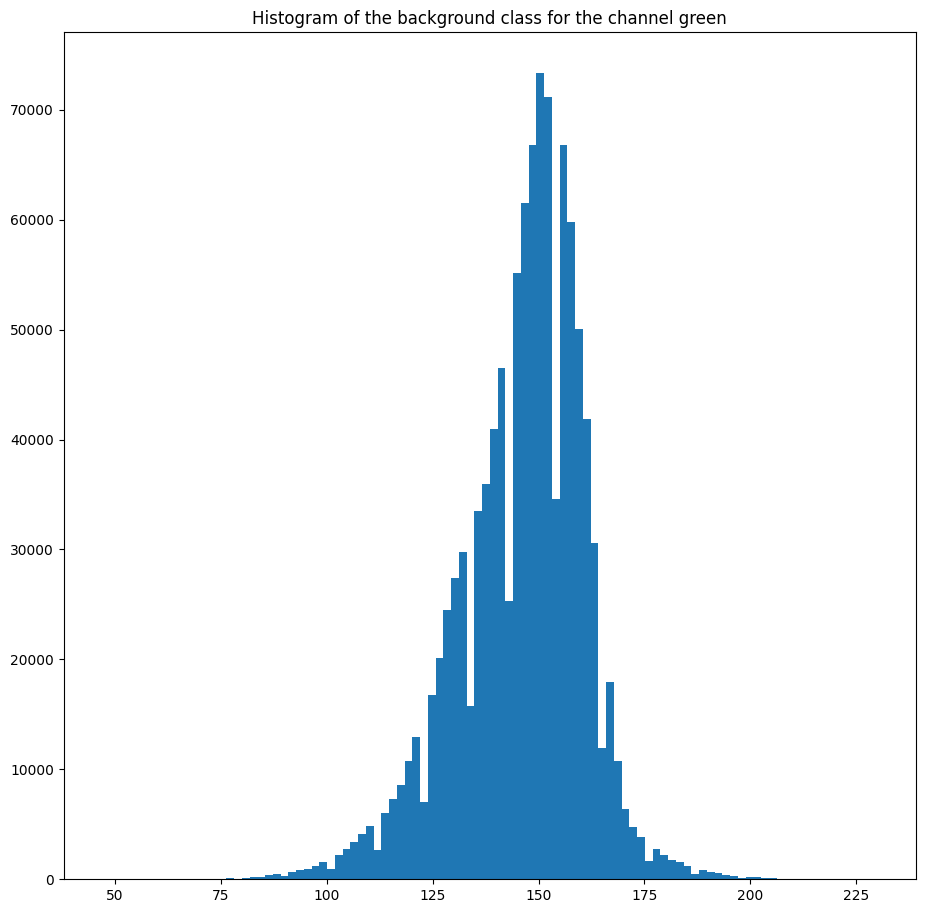

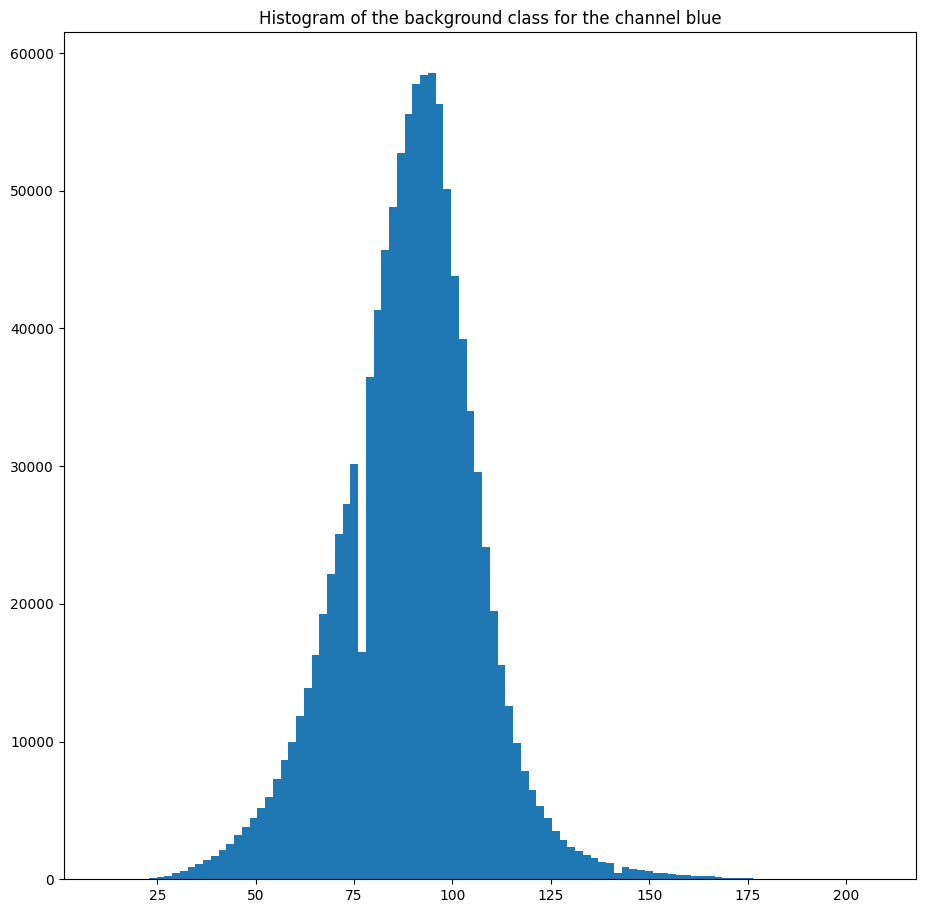

In [41]:
# allows you to change the display size of plt.show
plt.rcParams['figure.figsize'] = [11, 11]

nomchan = ["red","green", "blue"]
for chan in range(3):
    plt.figure()
    plt.hist(rect_zebra[:,:,chan].flatten(),100)
    plt.title("Histogram of the zebra class for the channel " + nomchan[chan])
    plt.show()


for chan in range(3):
    plt.figure()
    plt.hist(rect_background[:,:,chan].flatten(),100)
    plt.title("Histogram of the background class for the channel " + nomchan[chan])
    plt.show()

Q15: Propose an algorithmic method to identify the two classes of the image "rect_zebra". Use a sklearn implementation of this algorithm to identify the mean vectors ($m_R$,$m_G$,$m_B$) for two classes of the "rect_zebra" image and two classes of the "rect_background" image.

*The following line of code can be used to transform the image into a suitable form.*

X = np.vstack([rect_zebra[:,:,i].flatten() for i in range(3)]).transpose()

Comment on the average vectors obtained. They can be displayed as an image using the code provided.

**Your answer &#x270D;**

A15: On utilise la méthode k-means.
- Pour le fond, on retrouve bien deux couleurs très proches qui représentent bien l'herbe (deux teintes de vert).
- Pour le zèbre, les deux classes s'apparentent à du noir et du blanc, mais la classe blanche est plus proche d'un gris.

In [43]:
# computation of class parameters in a semi-automatic way
from sklearn.cluster import KMeans
import numpy as np

# use a number of classes =2 for the zebra part (complete n_clusters=?)
X = np.vstack([rect_zebra[:,:,i].flatten() for i in range(3)]).transpose()
kmeans_zebra = KMeans(n_clusters=2, random_state=0).fit(X)
mean_vectors_zebra = kmeans_zebra.cluster_centers_

# use a number of classes =2 for the background part
X = np.vstack([rect_background[:,:,i].flatten() for i in range(3)]).transpose()
kmeans_background = KMeans(n_clusters=2, random_state=0).fit(X)
mean_vectors_background = kmeans_background.cluster_centers_

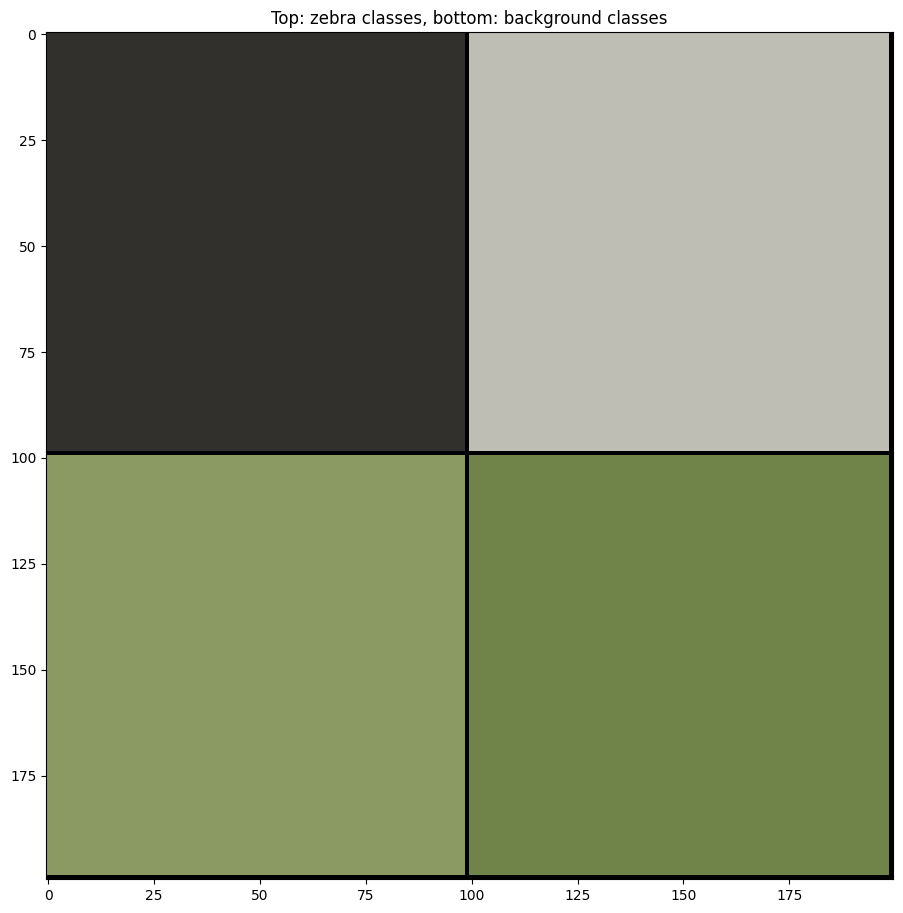

In [44]:
# display of the class centers found as an image
image_mean_vectors = np.zeros((200,200,3),np.uint8)
for i in range(3):
    image_mean_vectors[0:99,0:99,i] = mean_vectors_zebra[0,i]
    image_mean_vectors[0:99,100:199,i] = mean_vectors_zebra[1,i]
    image_mean_vectors[100:199,0:99,i] = mean_vectors_background[0,i]
    image_mean_vectors[100:199,100:199,i] = mean_vectors_background[1,i]

plt.figure()
plt.imshow(image_mean_vectors,vmax = 255)
plt.title("Top: zebra classes, bottom: background classes")
plt.show()

Q16: Display separately two neg-log-likelihood images (the neg-log-likelihood was used as a data attachment in the previous example) for the two zebra classes.
Build a neg-log-likelihood image corresponding to the minimum of the two neg-log-likelihoods of the zebra classes. Similarly for the background class.

Display them and comment.

**Your answer &#x270D;**

A16:
- Pour le zèbre: ça marche bien, on arrive à séparer le zèbre du fond.
- Pour le fond, on garde certaines rayures du zèbre en plus du fond.

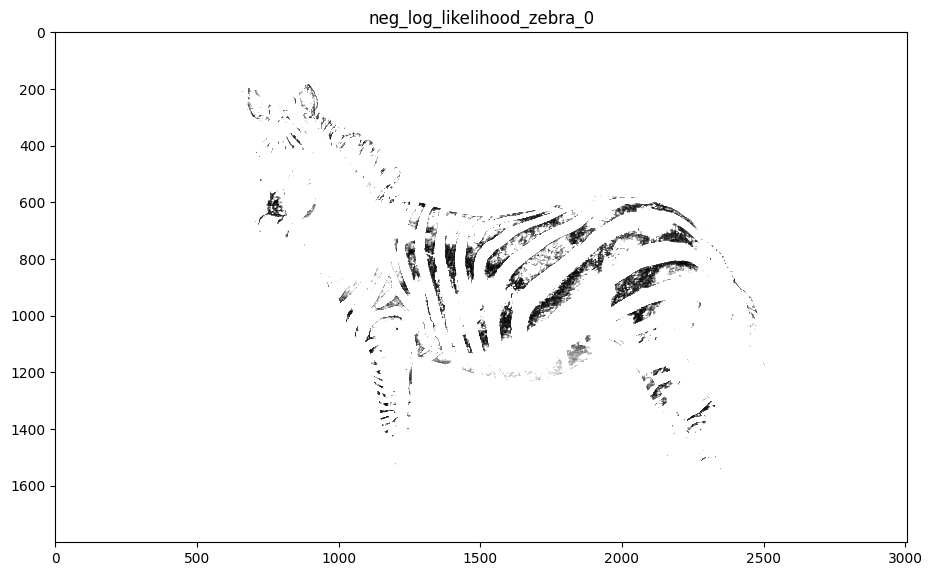

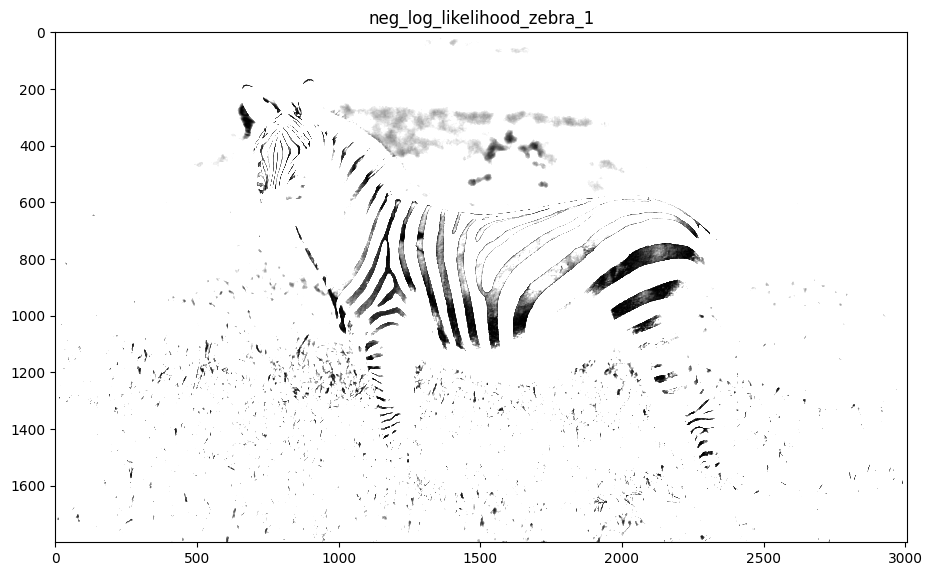

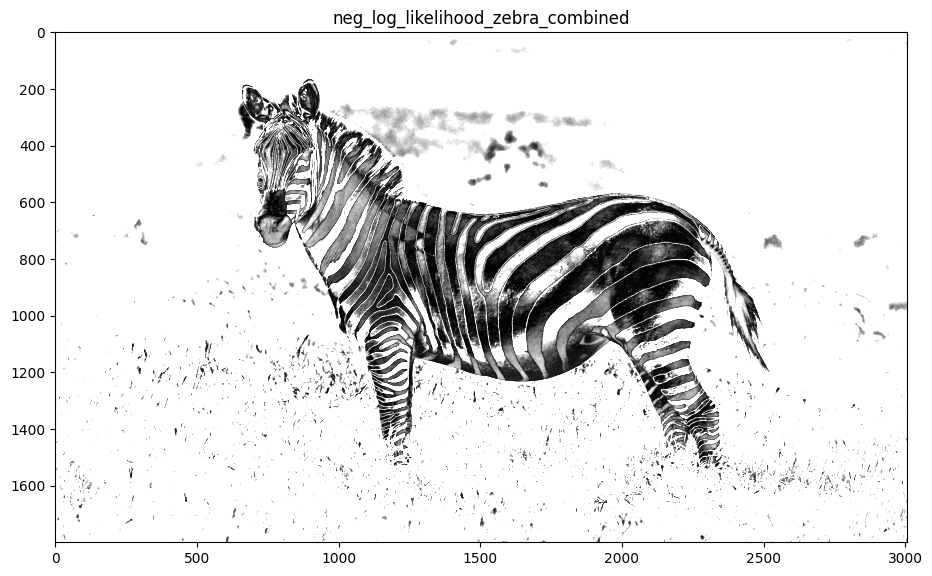

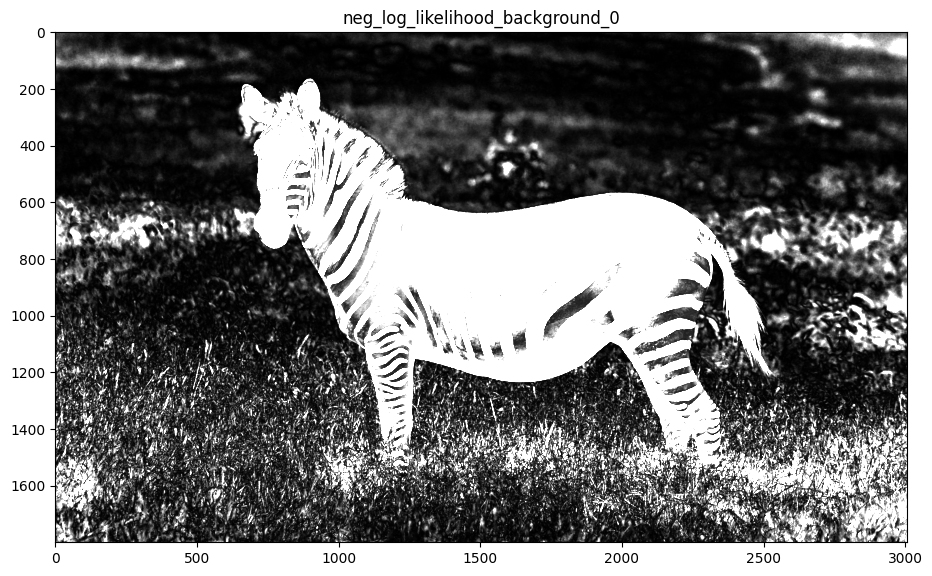

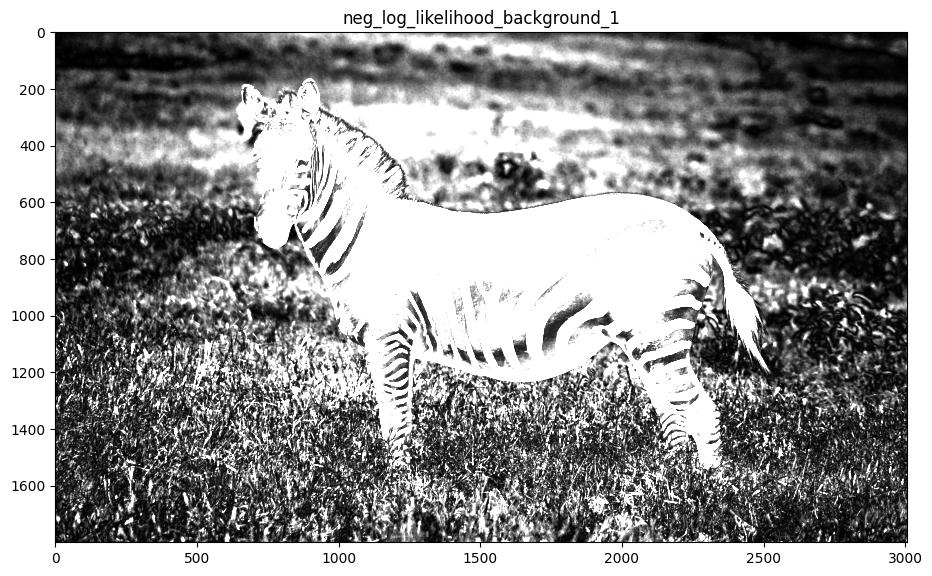

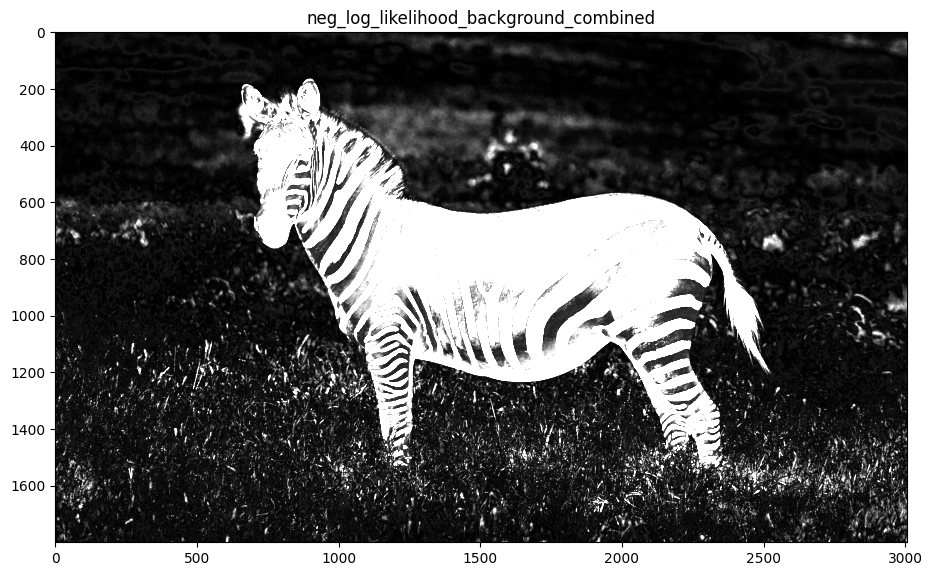

In [47]:
# calculation of the neg-log-likelihood of the zebra class
neg_log_likelihood_zebra_0 = sum((I_zebra[:,:,i]-mean_vectors_zebra[0,i])**2 for i in range(3))

plt.figure()
plt.imshow(neg_log_likelihood_zebra_0,cmap='gray', vmax = 600)
plt.title("neg_log_likelihood_zebra_0")
plt.show()

neg_log_likelihood_zebra_1 = sum((I_zebra[:,:,i]-mean_vectors_zebra[1,i])**2 for i in range(3))

plt.figure()
plt.imshow(neg_log_likelihood_zebra_1,cmap='gray', vmax = 5000)
plt.title("neg_log_likelihood_zebra_1")
plt.show()

neg_log_likelihood_zebra_combined = np.minimum(neg_log_likelihood_zebra_0,neg_log_likelihood_zebra_1)

plt.figure()
plt.imshow(neg_log_likelihood_zebra_combined,cmap='gray', vmax = 5000)
plt.title("neg_log_likelihood_zebra_combined")
plt.show()

# TO BE COMPLETED
# calculate the neg-log-likelihood of the background
neg_log_likelihood_background_0 = sum((I_zebra[:,:,i]-mean_vectors_background[0,i])**2 for i in range(3))
plt.figure()
plt.imshow(neg_log_likelihood_background_0,cmap='gray', vmax = 5000)
plt.title("neg_log_likelihood_background_0")
plt.show()

# call the output neg_log_likelihood_background_combined
neg_log_likelihood_background_1 = sum((I_zebra[:,:,i]-mean_vectors_background[1,i])**2 for i in range(3))
plt.figure()
plt.imshow(neg_log_likelihood_background_1,cmap='gray', vmax = 5000)
plt.title("neg_log_likelihood_background_1")
plt.show()
neg_log_likelihood_background_combined = np.minimum(neg_log_likelihood_background_0,neg_log_likelihood_background_1)
plt.figure()
plt.imshow(neg_log_likelihood_background_combined,cmap='gray', vmax = 5000)
plt.title("neg_log_likelihood_background_combined")
plt.show()





Q17: From these combined data attachment images (one for the background and one for the zebra), set up a graph-cut segmentation of the image with the $\beta$ of your choice. Comment the result.

**Your answer &#x270D;**

A17: La segmentation n'est pas tout à fait satisfaisante: on arrive à séparer le zèbre du fond, mais certaines rayures du zèbres (blanches) sont confondues avec le fond, notamment à l'arrière du zèbre.

Max Flow: 5326088759.948475


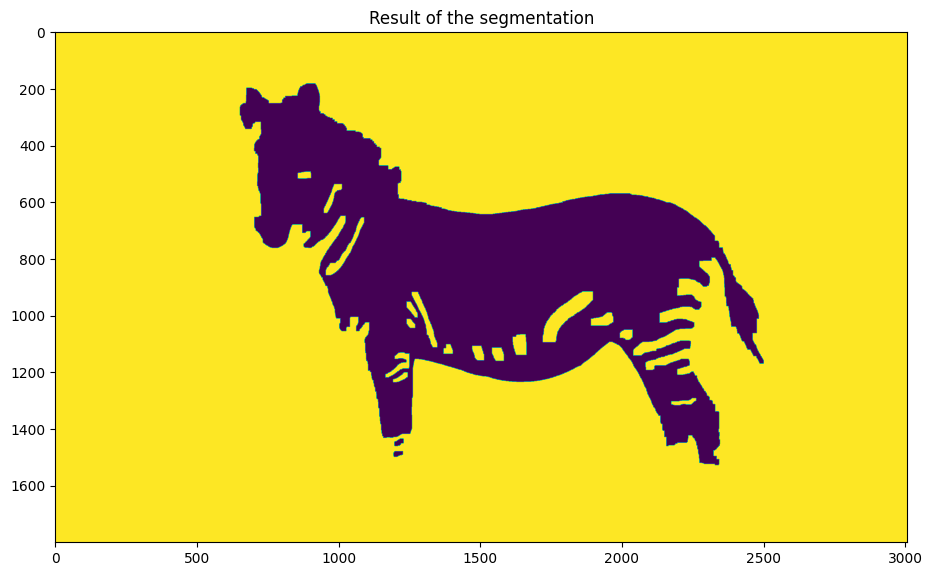

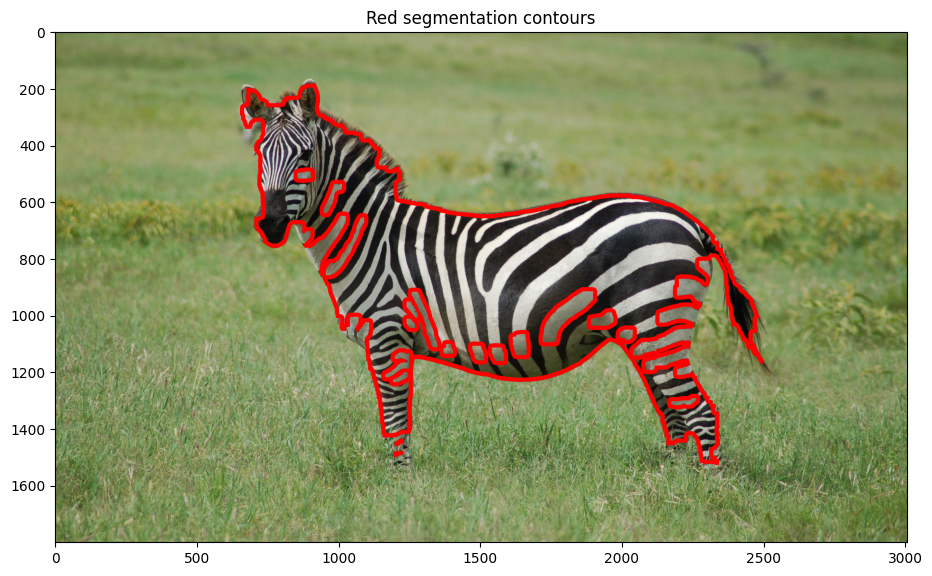

In [68]:
beta = 50000. # Optimal beta value to be determined

## Binary graph cut

# Create the graph.
g = maxflow.Graph[float]() # Graph instantiation
# Add the nodes. nodeids has the identifiers of the nodes in the grid.
nodeids = g.add_grid_nodes(I_zebra.shape[0:2]) # Create a grid with a non-terminal node for each pixel in the image
# Add non-terminal edges with the same capacity.
g.add_grid_edges(nodeids, beta) # Addition of a beta weight edge between each adjacent node according to the 4-connexity
# Add the terminal edges.

# TO BE COMPLETED
g.add_grid_tedges(nodeids, neg_log_likelihood_zebra_combined, neg_log_likelihood_background_combined)


# Find the maximum flow.
flow = g.maxflow()

print("Max Flow:", str(flow))
# Get the segments of the nodes in the grid.
sgm = g.get_grid_segments(nodeids)
im_bin = np.int_(np.logical_not(sgm))

plt.figure()
plt.imshow(im_bin)
plt.title("Result of the segmentation")
plt.show()

plt.figure()
plt.imshow(display_segmentation_borders(I_zebra, im_bin))
plt.title("Red segmentation contours")
plt.show()

Q18: From the obtained segmentation, determine the mean vectors for 5 classes for the background and 5 classes for the zebra. Use these lists of mean vectors to construct new neg-log-likelihood combination images. Comment on them.

**Your answer &#x270D;**

A18: Quand on utilise 5 classes, on obtient un meilleur résultat. Les rayures ont différentes teintes de gris ( du aux ombres elles ne sont pas forcément toutes blanches ou toutes noires). En utilisant cinqs classes cela nous permet de couvrir et représenter une plus grosse partie du zèbre.

In [49]:
# The computing of this cell can take several minutes.

X_1 = np.vstack([I_zebra[im_bin==1,i].flatten() for i in range(3)]).transpose()
kmeans_zebra2 = KMeans(n_clusters=5, random_state=0).fit(X_1)
mean_vectors_zebra2 = kmeans_zebra2.cluster_centers_

X_2 = np.vstack([I_zebra[im_bin==0,i].flatten() for i in range(3)]).transpose()
kmeans_background2 = KMeans(n_clusters=5, random_state=0).fit(X_2)
mean_vectors_background2 = kmeans_background2.cluster_centers_

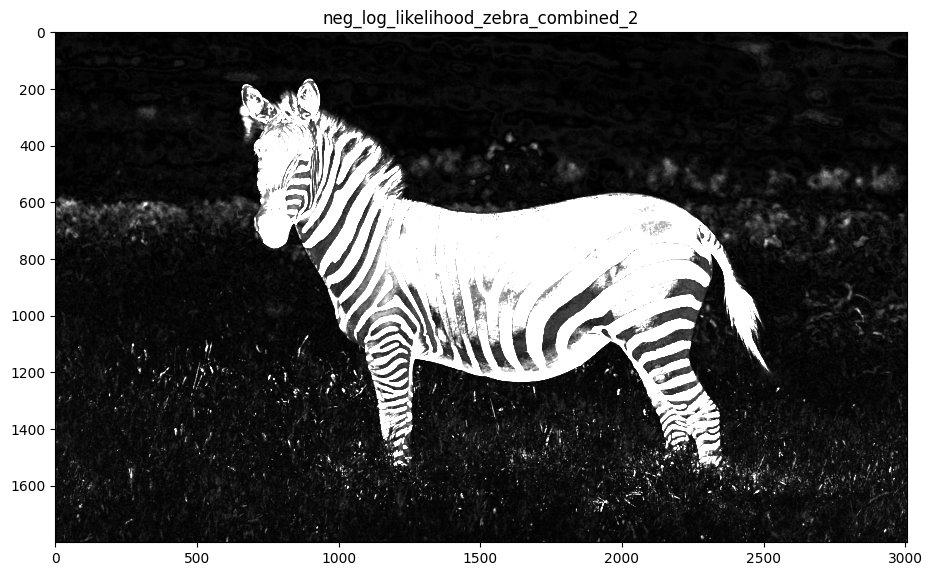

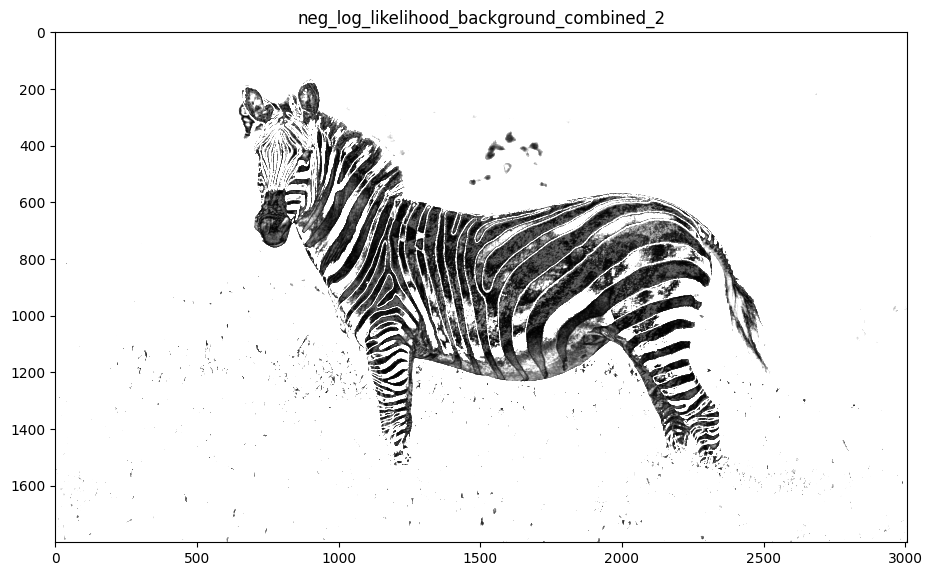

In [50]:
neg_log_likelihood_zebra_combined_2 = np.amin(np.dstack([(sum((I_zebra[:,:,i]-mean_vectors_zebra2[n_cl,i])**2 for i in range(3))) for n_cl in range(len(mean_vectors_zebra2))]),2)

neg_log_likelihood_background_combined_2 = np.amin(np.dstack([(sum((I_zebra[:,:,i]-mean_vectors_background2[n_cl,i])**2 for i in range(3))) for n_cl in range(len(mean_vectors_background2))]),2)

plt.figure()
plt.imshow(neg_log_likelihood_zebra_combined_2 ,cmap='gray', vmax = 3000)
plt.title("neg_log_likelihood_zebra_combined_2")
plt.show()

plt.figure()
plt.imshow(neg_log_likelihood_background_combined_2,cmap='gray', vmax = 1000)
plt.title("neg_log_likelihood_background_combined_2")
plt.show()


Q19: From these neg-log-likelihood images, segment the image by graph-cut using a new value of $\beta$ that gives you the best result. Comment on the result and the new value of $\beta$ that allowed you to obtain it. What about the new 5-class data attachment compared to the previous one?

**Your answer &#x270D;**

A19: Le résultat obtenu est très satisfaisant: on arrive bient à séparer le zèbre du fond.

Pour le $\beta$ optimal, j'obtiens une valeur de 60000. En dessous, certaines rayures blanches du zèbres sont encore confondues avec le fond. Au delà, on perds des informations sur les détails des contours du zèbre ( comme les oreilles ou les pattes).

Max Flow: 2109061479.8838747


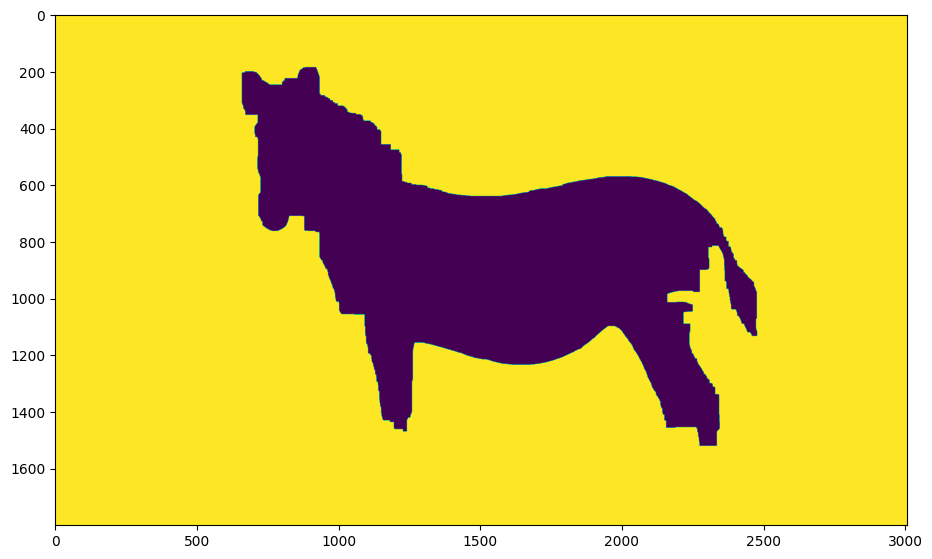

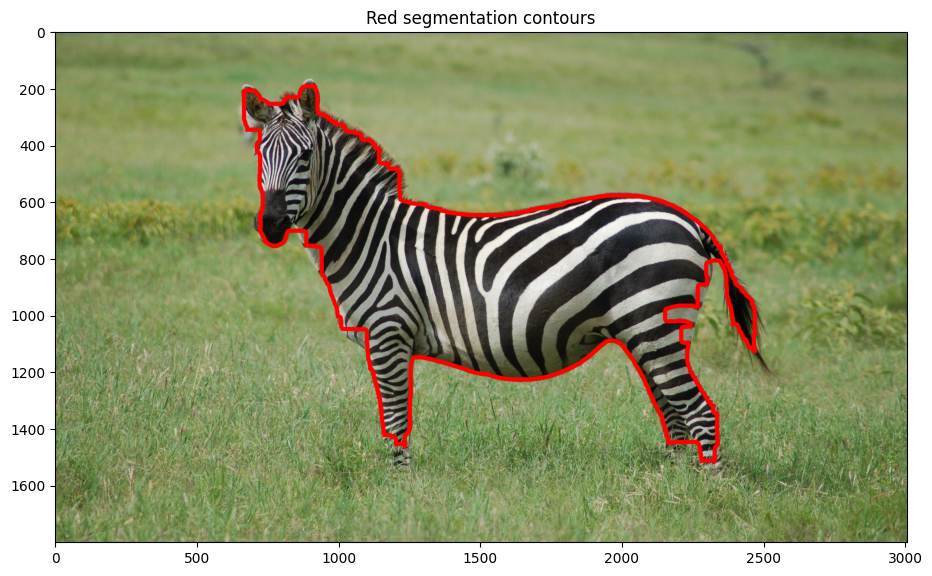

In [66]:
beta =  60000.
g = maxflow.Graph[float]() # Graph instantiation
# Add the nodes. nodeids has the identifiers of the nodes in the grid.
nodeids = g.add_grid_nodes(I_zebra.shape[0:2])
# Add non-terminal edges with the same capacity.
g.add_grid_edges(nodeids, beta)
# Add the terminal edges.
g.add_grid_tedges(nodeids,neg_log_likelihood_background_combined_2, neg_log_likelihood_zebra_combined_2)

flow = g.maxflow()

print("Max Flow:", str(flow))
# Get the segments of the nodes in the grid.
sgm = g.get_grid_segments(nodeids) # Returns 1 if the pixel is on the drain side after calculation of the min cut, 0 if it is on the source side
im_bin = np.int_(np.logical_not(sgm))

plt.figure()
plt.imshow(im_bin)
plt.show()

plt.figure()
plt.imshow(display_segmentation_borders(I_zebra, im_bin))
plt.title("Red segmentation contours")
plt.show()